# Movies Dataset Vector Database Demo with Eventhouse in Fabric

This notebook demonstrates how to:
1. Load the movies dataset into KQL Database
2. Create tables with vector columns for storing embeddings
3. Use KQL Database as a vector database for similarity search
4. Demonstrate RAG (Retrieval Augmented Generation) patterns

## Prerequisites

To follow this guide, you will need to ensure that you have access to the following services and have the necessary credentials and keys set up.

1. Microsoft Fabric :

   Create Fabric Workspace: https://learn.microsoft.com/en-us/fabric/fundamentals/create-workspaces

   Create a Lakehouse: https://learn.microsoft.com/en-us/fabric/data-engineering/tutorial-build-lakehouse

   Upload 'movies_metadata' files to Lakehouse: https://learn.microsoft.com/en-us/fabric/data-engineering/load-data-lakehouse#local-file-upload

   Import this notebook in to the same Lakehouse: https://learn.microsoft.com/en-us/fabric/data-engineering/how-to-use-notebook#import-existing-notebooks
   
   Create Eventhouse: https://learn.microsoft.com/en-us/fabric/real-time-intelligence/create-eventhouse
     
   
2. Azure OpenAI Studio to manage and deploy OpenAI models:

## Architecture

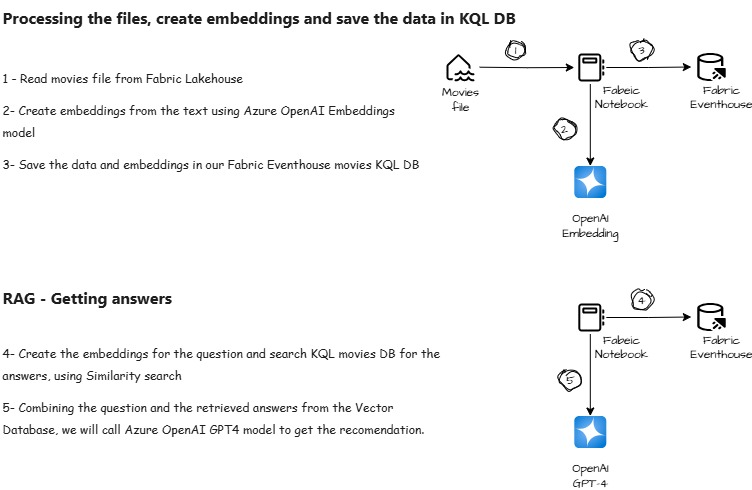


## 1. Install openai and azure-kusto-data libraries

The openai library lets you integrate advanced AI models like GPT for tasks such as generating text or creating embeddings, while azure-kusto-data is your go-to for programmatically querying and managing data within KQL databases like Microsoft Fabric Eventhouses.

In [1]:
%pip install openai>=1.12.0 azure-kusto-data

StatementMeta(, 2353a485-cab0-402f-8ab4-ee0ab6cba7ed, 7, Finished, Available, Finished)

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
nni 3.0 requires filelock<3.12, but you have filelock 3.13.1 which is incompatible.
datasets 2.19.1 requires fsspec[http]<=2024.3.1,>=2023.1.0, but you have fsspec 2024.6.1 which is incompatible.

[notice] A new release of pip is available: 24.0 -> 25.1.1
[notice] To update, run: python -m pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.



## 2. Load movies CSV file containing movie metadata

In [2]:
import pandas as pd

# Load the movies metadata
movies_df = pd.read_csv('/lakehouse/default/Files/movies_metadata.csv', low_memory=False)

print("Movies Dataset Shape:", movies_df.shape)
# print("Movies Dataset Shape:", ratings_df.shape)
print("\nMovies Dataset Columns:")
print(movies_df.columns.tolist())
print("\nFirst few rows of movies dataset:")
print(movies_df.head())

StatementMeta(, 2353a485-cab0-402f-8ab4-ee0ab6cba7ed, 9, Finished, Available, Finished)

Movies Dataset Shape: (45466, 24)

Movies Dataset Columns:
['adult', 'belongs_to_collection', 'budget', 'genres', 'homepage', 'id', 'imdb_id', 'original_language', 'original_title', 'overview', 'popularity', 'poster_path', 'production_companies', 'production_countries', 'release_date', 'revenue', 'runtime', 'spoken_languages', 'status', 'tagline', 'title', 'video', 'vote_average', 'vote_count']

First few rows of movies dataset:
   adult                              belongs_to_collection    budget  \
0  False  {'id': 10194, 'name': 'Toy Story Collection', ...  30000000   
1  False                                                NaN  65000000   
2  False  {'id': 119050, 'name': 'Grumpy Old Men Collect...         0   
3  False                                                NaN  16000000   
4  False  {'id': 96871, 'name': 'Father of the Bride Col...         0   

                                              genres  \
0  [{'id': 16, 'name': 'Animation'}, {'id': 35, '...   
1  [{'id': 12, '

## 3. Clean movies dataset

In [3]:
def clean_movies_data(df):
    df_clean = df.dropna(subset=['title', 'overview', 'id']).copy()
    df_clean['id'] = pd.to_numeric(df_clean['id'], errors='coerce')
    df_clean = df_clean.dropna(subset=['id'])
    df_clean['id'] = df_clean['id'].astype(int)
    df_clean['overview'] = df_clean['overview'].fillna('')
    df_clean['combined_text'] = (
        df_clean['title'].fillna('') + ' ' +
        df_clean['overview'].fillna('') + ' ' +
        df_clean['genres'].fillna('')
    )
    return df_clean

movies_clean = clean_movies_data(movies_df)
movies_subset = movies_clean.head(1000).copy()

print(f"Cleaned dataset shape: {movies_subset.shape}")
print(f"Sample of combined text:")
print(movies_subset['combined_text'].head(3).tolist())

StatementMeta(, 2353a485-cab0-402f-8ab4-ee0ab6cba7ed, 10, Finished, Available, Finished)

Cleaned dataset shape: (1000, 25)
Sample of combined text:
["Toy Story Led by Woody, Andy's toys live happily in his room until Andy's birthday brings Buzz Lightyear onto the scene. Afraid of losing his place in Andy's heart, Woody plots against Buzz. But when circumstances separate Buzz and Woody from their owner, the duo eventually learns to put aside their differences. [{'id': 16, 'name': 'Animation'}, {'id': 35, 'name': 'Comedy'}, {'id': 10751, 'name': 'Family'}]", "Jumanji When siblings Judy and Peter discover an enchanted board game that opens the door to a magical world, they unwittingly invite Alan -- an adult who's been trapped inside the game for 26 years -- into their living room. Alan's only hope for freedom is to finish the game, which proves risky as all three find themselves running from giant rhinoceroses, evil monkeys and other terrifying creatures. [{'id': 12, 'name': 'Adventure'}, {'id': 14, 'name': 'Fantasy'}, {'id': 10751, 'name': 'Family'}]", "Grumpier Old Men A f

## 4. Set up authentication and initializes OpenAI client

In [ ]:
import pandas as pd
import time
from openai import AzureOpenAI

# Define constants for Azure OpenAI and Kusto configurations
OPENAI_DEPLOYMENT_ENDPOINT = "<OPENAI_DEPLOYMENT_ENDPOINT>"
OPENAI_API_KEY = "<OPENAI_API_KEY>"
EMBEDDING_MODEL = "text-embedding-3-small"
OPENAI_GPT4_DEPLOYMENT_NAME = "gpt-4o-mini"
AZURE_OPENAI_API_VERSION = "2024-12-01-preview"

# Define the Kusto cluster and database details
KUSTO_CLUSTER = "<Fabric Eventhouse query URI>"
KUSTO_DATABASE = "movies"

# Initialize Azure OpenAI client
client = AzureOpenAI(
    azure_endpoint=OPENAI_DEPLOYMENT_ENDPOINT,
    api_key=OPENAI_API_KEY,
    api_version=AZURE_OPENAI_API_VERSION
)

StatementMeta(, 2353a485-cab0-402f-8ab4-ee0ab6cba7ed, 11, Finished, Available, Finished)

## 5. Set up authentication and initializes a Kusto client to connect to KQL database

In [ ]:
from azure.kusto.data import KustoClient, KustoConnectionStringBuilder

# Define the Kusto table name
KUSTO_TABLE_MOVIES = "movies"

# Get the access token for the Kusto cluster
access_token = mssparkutils.credentials.getToken(KUSTO_CLUSTER)

# Create a Kusto connection string using the access token
kusto_connection = KustoConnectionStringBuilder.with_aad_application_token_authentication(KUSTO_CLUSTER, application_token=access_token)

# Initialize the Kusto client with the connection string
kusto_client = KustoClient(kusto_connection)

StatementMeta(, 2353a485-cab0-402f-8ab4-ee0ab6cba7ed, 12, Finished, Available, Finished)

## 6. Create a function to retrieve text embedding from Azure OpenAI

In [6]:
# Function to get Azure OpenAI embedding for a given text
def get_azure_openai_embedding(text, model=EMBEDDING_MODEL):
    try:
        # Request embedding from Azure OpenAI
        response = client.embeddings.create(
            input=text,
            model=model
        )
        # Return the embedding from the response
        return response.data[0].embedding
    except Exception as e:
        # Print error message if an exception occurs
        print(f"Error getting embedding: {e}")
        return None

StatementMeta(, 2353a485-cab0-402f-8ab4-ee0ab6cba7ed, 13, Finished, Available, Finished)

## 7. Generate embeddings on description column using Azure OpenAI and returns a filtered dataset with successful embeddings


In [7]:
def generate_movie_embeddings_batch(movies_df, batch_size=10):
    embeddings = []
    failed_count = 0
    print(f"Note: Using first 50 movies for demo to manage Azure OpenAI API costs")
    print(f"Generating embeddings for 50 movies using {EMBEDDING_MODEL}...")
    print(f"Processing in batches of {batch_size}")

    # movies_demo = movies_df.head(1000).copy()
    movies_demo = movies_subset

    for i in range(0, len(movies_demo), batch_size):
        batch = movies_demo.iloc[i:i+batch_size]
        print(f"Processing batch {i//batch_size + 1}/{(len(movies_demo)-1)//batch_size + 1}")
        batch_texts = batch['combined_text'].tolist()
        try:
            response = client.embeddings.create(
                input=batch_texts,
                model=EMBEDDING_MODEL
            )
            batch_embeddings = [item.embedding for item in response.data]
            embeddings.extend(batch_embeddings)
            time.sleep(1)
        except Exception as e:
            print(f"Error processing batch {i//batch_size + 1}: {e}")
            embeddings.extend([None] * len(batch_texts))
            failed_count += len(batch_texts)
            time.sleep(5)

    print(f"Embedding generation completed!")
    print(f"Successfully generated: {len(embeddings) - failed_count} embeddings")
    print(f"Failed: {failed_count} embeddings")
    movies_demo['embedding'] = embeddings
    movies_demo = movies_demo.dropna(subset=['embedding'])
    print(f"Final dataset size: {len(movies_demo)} movies with embeddings")
    print(f"Embedding dimensions: {len(movies_demo['embedding'].iloc[0]) if len(movies_demo) > 0 else 'N/A'}")
    if len(movies_demo) > 0:
        print("Sample embedding (first 10 dimensions):")
        print(movies_demo['embedding'].iloc[0][:10])
    return movies_demo
movies_demo = generate_movie_embeddings_batch(movies_subset)    

StatementMeta(, 2353a485-cab0-402f-8ab4-ee0ab6cba7ed, 14, Finished, Available, Finished)

Note: Using first 50 movies for demo to manage Azure OpenAI API costs
Generating embeddings for 50 movies using text-embedding-3-small...
Processing in batches of 10
Processing batch 1/100
Processing batch 2/100
Processing batch 3/100
Processing batch 4/100
Processing batch 5/100
Processing batch 6/100
Processing batch 7/100
Processing batch 8/100
Processing batch 9/100
Processing batch 10/100
Processing batch 11/100
Processing batch 12/100
Processing batch 13/100
Processing batch 14/100
Processing batch 15/100
Processing batch 16/100
Processing batch 17/100
Processing batch 18/100
Processing batch 19/100
Processing batch 20/100
Processing batch 21/100
Processing batch 22/100
Processing batch 23/100
Processing batch 24/100
Processing batch 25/100
Processing batch 26/100
Processing batch 27/100
Processing batch 28/100
Processing batch 29/100
Processing batch 30/100
Processing batch 31/100
Processing batch 32/100
Processing batch 33/100
Processing batch 34/100
Processing batch 35/100
Pro

In [8]:
display(movies_demo)

StatementMeta(, 2353a485-cab0-402f-8ab4-ee0ab6cba7ed, 15, Finished, Available, Finished)

SynapseWidget(Synapse.DataFrame, 67a34074-8573-436b-82b0-d995552589d2)

## 8. Transform and clean movie metadata into a structured DataFrame with consistent types and formats

In [9]:
import pandas as pd

# Apply transformations to the movies_demo DataFrame and create a new DataFrame df_movies_transformed
df_movies_transformed = pd.DataFrame({
    # Convert 'id' to integer type
    'movie_id': movies_demo['id'].astype(int),
    
    # Convert 'title' to string type and truncate to 500 characters
    'title': movies_demo['title'].astype(str).str[:500],
    
    # Convert 'overview' to string type if not null, else set to None
    'overview': movies_demo['overview'].apply(lambda x: str(x) if pd.notna(x) else None),
    
    # Convert 'genres' to string type if not null, else set to None
    'genres': movies_demo['genres'].apply(lambda x: str(x) if pd.notna(x) else None),
    
    # Directly copy 'embedding' column
    'embedding': movies_demo['embedding'],
    
    # Convert 'release_date' to datetime, coerce errors, and extract date part
    'release_date': pd.to_datetime(movies_demo['release_date'], errors='coerce').dt.date,
    
    # Convert 'budget' to integer type if not null and is a digit, else set to None
    'budget': movies_demo['budget'].apply(lambda x: int(x) if pd.notna(x) and str(x).isdigit() else None),
    
    # Convert 'revenue' to integer type if not null and is a digit, else set to None
    'revenue': movies_demo['revenue'].apply(lambda x: int(x) if pd.notna(x) and str(x).isdigit() else None),
    
    # Convert 'runtime' to float type if not null, else set to None
    'runtime': movies_demo['runtime'].apply(lambda x: float(x) if pd.notna(x) else None),
    
    # Convert 'vote_average' to float type if not null, else set to None
    'vote_average': movies_demo['vote_average'].apply(lambda x: float(x) if pd.notna(x) else None),
    
    # Convert 'vote_count' to integer type if not null, else set to None
    'vote_count': movies_demo['vote_count'].apply(lambda x: int(x) if pd.notna(x) else None),
    
    # Convert 'popularity' to float type if not null, else set to None
    'popularity': movies_demo['popularity'].apply(lambda x: float(x) if pd.notna(x) else None),
    
    # Convert 'original_language' to string type, truncate to 10 characters if not null, else set to None
    'original_language': movies_demo['original_language'].apply(lambda x: str(x)[:10] if pd.notna(x) else None),
    
    # Convert 'combined_text' to string type
    'combined_text': movies_demo['combined_text'].astype(str)
})

StatementMeta(, 2353a485-cab0-402f-8ab4-ee0ab6cba7ed, 16, Finished, Available, Finished)

## 9. Create a DataFrame with movie IDs, titles, embeddings, and the embedding model used for each movie

In [10]:
# Create a DataFrame named df_movies_embedding
df_movies_embedding = pd.DataFrame({
    # Convert the 'id' column from movies_demo to integer and assign to 'movie_id'
    'movie_id': movies_demo['id'].astype(int),
    
    # Convert the 'title' column from movies_demo to string, truncate to 500 characters, and assign to 'title'
    'title': movies_demo['title'].astype(str).str[:500],
    
    # Directly assign the 'embedding' column from movies_demo to 'embedding'
    'embedding': movies_demo['embedding'],
    
    # Assign the constant EMBEDDING_MODEL to 'embedding_model'
    'embedding_model': EMBEDDING_MODEL
})

StatementMeta(, 2353a485-cab0-402f-8ab4-ee0ab6cba7ed, 17, Finished, Available, Finished)

In [11]:
display(df_movies_embedding)

StatementMeta(, 2353a485-cab0-402f-8ab4-ee0ab6cba7ed, 18, Finished, Available, Finished)

SynapseWidget(Synapse.DataFrame, 30181459-d303-434c-bf7f-d286f5be6a40)

## 10. Drop 'movies' and 'movie_vectors' tables in KQL database

In [12]:
# --- Clear 'movies' table data ---
try:
    print(f"Attempting to drop movies' in database '{KUSTO_DATABASE}'...")
    response_movies = kusto_client.execute(KUSTO_DATABASE, f"""
        .drop table movies ifexists;
    """)
    print("Successfully dropped 'movies' table.")

except Exception as e:
    print(f"An unexpected error occurred while dropping 'movies' table: {e}", exc_info=True)

# --- Clear 'movie_vectors' table data ---
try:
    print(f"Attempting to drop table 'movie_vectors' in database '{KUSTO_DATABASE}'...")
    response_movie_vectors = kusto_client.execute(KUSTO_DATABASE, f"""
        .drop table movie_vectors ifexists;
    """)
    print("Successfully cdropped 'movie_vectors' table.")

except KustoServiceError as e:
    print(f"Kusto Service Error while dropping 'movie_vectors' table: {e.args[0]}")

except Exception as e:
    print(f"An unexpected error occurred while dropping 'movie_vectors' table: {e}", exc_info=True)


StatementMeta(, 2353a485-cab0-402f-8ab4-ee0ab6cba7ed, 19, Finished, Available, Finished)

Attempting to drop movies' in database 'movies'...
Successfully dropped 'movies' table.
Attempting to drop table 'movie_vectors' in database 'movies'...
Successfully cdropped 'movie_vectors' table.


## Create 'movies' and 'movie_vectors' in KQL database

In [13]:
# --- Clear 'movies' table data ---
try:
    print(f"Attempting to create the table 'movies' in database '{KUSTO_DATABASE}'...")
    response_movies = kusto_client.execute(KUSTO_DATABASE, f"""
        .create table movies (
            movie_id: int,
            title: string,
            overview: string,
            genres: string,
            release_date: datetime,
            budget: long,
            revenue: long,
            runtime: real,
            vote_average: real,
            vote_count: int,
            popularity: real,
            original_language: string,
            combined_text: string,
            created_at: datetime);
    """)
    print("Successfully created the 'movies' table.")

except Exception as e:
    print(f"An unexpected error occurred while creating 'movies' table: {e}", exc_info=True)

# --- Clear 'movie_vectors' table data ---
try:
    print(f"Attempting to create the table 'movie_vectors' in database '{KUSTO_DATABASE}'...")
    response_movie_vectors = kusto_client.execute(KUSTO_DATABASE, f"""
        .create table movie_vectors (
            movie_id: int,
            title: string,
            embedding: dynamic,
            embedding_model: string,
            created_at: datetime
        );
    """)
    print("Successfully created 'movie_vectors' table.")

except KustoServiceError as e:
    print(f"Kusto Service Error while creating 'movie_vectors' table: {e.args[0]}")

except Exception as e:
    print(f"An unexpected error occurred while creating 'movie_vectors' table: {e}", exc_info=True)


StatementMeta(, 2353a485-cab0-402f-8ab4-ee0ab6cba7ed, 20, Finished, Available, Finished)

Attempting to create the table 'movies' in database 'movies'...
Successfully created the 'movies' table.
Attempting to create the table 'movie_vectors' in database 'movies'...
Successfully created 'movie_vectors' table.


## 11. Write movies data to Azure Kusto table 'movies' using the Spark connector

In [14]:
# Create a Spark DataFrame from the transformed movies DataFrame
movies_spark_df = spark.createDataFrame(df_movies_transformed)

# Define the Kusto table name where the data will be written
KUSTO_TABLE_MOVIES = "movies"

# Write the Spark DataFrame to a table in Eventhouse using the Kusto Spark connector
movies_spark_df.write. \
format("com.microsoft.kusto.spark.synapse.datasource"). \
option("kustoCluster",KUSTO_CLUSTER). \
option("kustoDatabase",KUSTO_DATABASE). \
option("kustoTable", KUSTO_TABLE_MOVIES). \
option("accessToken", access_token). \
option("tableCreateOptions", "CreateIfNotExist").\
mode("Append"). \
save()

StatementMeta(, 2353a485-cab0-402f-8ab4-ee0ab6cba7ed, 21, Finished, Available, Finished)

## 12. Write movie vectors data to Azure Kusto table 'movie_vectors' using the Spark connector

In [15]:
# Create a Spark DataFrame from the transformed movie vectors DataFrame
df_movies_embedding_spark_df = spark.createDataFrame(df_movies_embedding)

# Define the Kusto table name where the data will be written
KUSTO_TABLE_VECTORS = "movie_vectors"

# Write the Spark DataFrame to a table in Eventhouse using the Kusto Spark connector
df_movies_embedding_spark_df.write. \
format("com.microsoft.kusto.spark.synapse.datasource"). \
option("kustoCluster",KUSTO_CLUSTER). \
option("kustoDatabase",KUSTO_DATABASE). \
option("kustoTable", KUSTO_TABLE_VECTORS). \
option("accessToken", access_token). \
option("tableCreateOptions", "CreateIfNotExist").\
mode("Append"). \
save()

StatementMeta(, 2353a485-cab0-402f-8ab4-ee0ab6cba7ed, 22, Finished, Available, Finished)

## 13. Execute basic queries on Azure Kusto to count rows and display sample movie data from the movies and vectors tables


In [16]:
from azure.kusto.data import KustoClient, KustoConnectionStringBuilder

def run_basic_queries():
    if not kusto_client:
        print("❌ No database connection")
        return
    
    # Check row counts for the movies table
    response = kusto_client.execute(KUSTO_DATABASE, f"{KUSTO_TABLE_MOVIES} | count")
    movies_count = response.primary_results[0][0]["Count"]
    print(f"Total movies in database: {movies_count}")

    # Check row counts for the vectors table
    response = kusto_client.execute(KUSTO_DATABASE, f"{KUSTO_TABLE_VECTORS} | count")
    vectors_count = response.primary_results[0][0]["Count"]
    print(f"Total vectors in database: {vectors_count}")

    # Show sample movie data, ordered by popularity and limited to top 5
    print("\n📽️ Sample movies:")
    response = kusto_client.execute(KUSTO_DATABASE, f"""
        {KUSTO_TABLE_MOVIES}
        | order by popularity desc
        | take 5
        | project ['movie_id'], ['title'], ['vote_average'], ['popularity']
    """)
    for row in response.primary_results[0]:
        print(f"ID: {row['movie_id']}, Title: {row['title']}, Rating: {row['vote_average']}, Popularity: {row['popularity']}")

    # Show sample movies with genres, limited to 3
    print("\n🎭 Sample movie with genres:")
    response = kusto_client.execute(KUSTO_DATABASE, f"""
        {KUSTO_TABLE_MOVIES}
        | where isnotempty(genres)
        | take 3
        | project ['title'], overview, genres
    """)
    for row in response.primary_results[0]:
        print(f"Title: {row['title']}")
        print(f"Overview: {row['overview'][:100] if row['overview'] else 'N/A'}...")
        print(f"Genres: {row['genres']}")
        print("-" * 50)

run_basic_queries()

StatementMeta(, 2353a485-cab0-402f-8ab4-ee0ab6cba7ed, 23, Finished, Available, Finished)

Total movies in database: 1000
Total vectors in database: 1000

📽️ Sample movies:
ID: 680, Title: Pulp Fiction, Rating: 154.0, Popularity: 8670.0
ID: 278, Title: The Shawshank Redemption, Rating: 142.0, Popularity: 8358.0
ID: 13, Title: Forrest Gump, Rating: 142.0, Popularity: 8147.0
ID: 11, Title: Star Wars, Rating: 121.0, Popularity: 6778.0
ID: 238, Title: The Godfather, Rating: 175.0, Popularity: 6024.0

🎭 Sample movie with genres:
Title: My Fair Lady
Overview: A misogynistic and snobbish phonetics professor agrees to a wager that he can take a flower girl and...
Genres: [{'id': 18, 'name': 'Drama'}, {'id': 10751, 'name': 'Family'}, {'id': 10402, 'name': 'Music'}, {'id': 10749, 'name': 'Romance'}]
--------------------------------------------------
Title: Sabrina
Overview: Linus and David Larrabee are the two sons of a very wealthy family. Linus is all work -- busily runn...
Genres: [{'id': 35, 'name': 'Comedy'}, {'id': 18, 'name': 'Drama'}, {'id': 10749, 'name': 'Romance'}]
--------

### Understanding Cosine Similarity

**Cosine similarity** is a powerful tool for gauging how alike two non-zero vectors are. You'll often find it used in areas like **text analysis**, **recommendation systems**, and **data clustering**. Essentially, it measures the cosine of the angle between two vectors in a multi-dimensional space. This tells us how similar their *direction* is, completely ignoring their size or magnitude.

The similarity score ranges from -1 to 1:
* **1**: Means the vectors point in the exact same direction, indicating perfect similarity.
* **0**: Means the vectors are at right angles (orthogonal) to each other, showing no similarity.
* **-1**: Means the vectors point in opposite directions, indicating complete dissimilarity.

Mathematically, it's defined as:

$$\text{Cosine Similarity} = \cos(\theta) = \frac{A \cdot B}{\|A\| \|B\|}$$

Where $A \cdot B$ is the **dot product** of vectors $A$ and $B$, and $\|A\|$ and $\|B\|$ represent their **Euclidean norms** (or magnitudes).

When working with text, vectors often represent documents or sentences (like word frequency counts or embeddings). In these cases, cosine similarity helps us understand how similar their content is.

---

### Calculating Cosine Similarity in Python

You can calculate cosine similarity in Python using a couple of common methods: **NumPy** for direct computation or **scikit-learn** for a more integrated solution.

#### Using NumPy

NumPy offers an efficient way to calculate cosine similarity by directly implementing the formula:

```python
import numpy as np

def calculate_cosine_similarity(vector_a, vector_b):
    # Calculate the dot product of the two vectors
    dot_product = np.dot(vector_a, vector_b)
    
    # Compute the magnitude (or norm) of each vector
    norm_a = np.linalg.norm(vector_a)
    norm_b = np.linalg.norm(vector_b)
    
    # Handle cases where a vector might be zero to avoid division errors
    if norm_a == 0 or norm_b == 0:
        return 0.0 # No similarity if one or both vectors are zero
    
    # Apply the cosine similarity formula
    return dot_product / (norm_a * norm_b)

# Here's an example:
vector_1 = np.array([1, 2, 3])
vector_2 = np.array([4, 5, 6])

similarity_score = calculate_cosine_similarity(vector_1, vector_2)
print(f"The Cosine Similarity between vector_1 and vector_2 is: {similarity_score}")


## 14. Define a function for Cosine similarity

In [17]:
import json
import numpy as np

# Function to calculate cosine similarity between two vectors
def cosine_similarity(vec1, vec2):
    vec1 = np.array(vec1)  # Convert first vector to numpy array
    vec2 = np.array(vec2)  # Convert second vector to numpy array
    dot_product = np.dot(vec1, vec2)  # Calculate dot product of the two vectors
    norm1 = np.linalg.norm(vec1)  # Calculate the norm (magnitude) of the first vector
    norm2 = np.linalg.norm(vec2)  # Calculate the norm (magnitude) of the second vector
    # Return the cosine similarity if both norms are greater than 0, otherwise return 0.0
    return dot_product / (norm1 * norm2) if norm1 > 0 and norm2 > 0 else 0.0

StatementMeta(, 2353a485-cab0-402f-8ab4-ee0ab6cba7ed, 24, Finished, Available, Finished)

## 15. Simple Demo on how to perform vector similarity calculation

In [18]:
# Function to demonstrate vector similarity calculations
def demonstrate_vector_similarity():
    if not kusto_client:  # Check if the database connection is available
        print("No database connection")
        return

    print("Vector Similarity Demonstrations\n")

    # Calculate similarity between two specific movies
    print("1️ Calculate similarity between two specific movies:")
    response = kusto_client.execute(KUSTO_DATABASE, f"""
        {KUSTO_TABLE_VECTORS}
        | where ['title'] contains "Toy Story" or ['title'] contains "Jumanji"
        | take 2
        | project ['title'], embedding
    """)

    # Extract embeddings from the response
    embeddings = [(row[0], json.loads(str(row[1]))) for row in response.primary_results[0]]
    
    if len(embeddings) >= 2:  # Ensure there are at least two embeddings
        title1, emb1 = embeddings[0]  # Get the first movie title and its embedding
        title2, emb2 = embeddings[1]  # Get the second movie title and its embedding
        similarity = cosine_similarity(emb1, emb2)  # Calculate cosine similarity
        euclidean_distance = np.linalg.norm(np.array(emb1) - np.array(emb2))  # Calculate Euclidean distance
        print(f"Cosine Similarity between {title1} and {title2}: {similarity:.4f}")
        print(f"Euclidean Distance between {title1} and {title2}: {euclidean_distance:.4f}")

# Call the function to demonstrate vector similarity
demonstrate_vector_similarity()

StatementMeta(, 2353a485-cab0-402f-8ab4-ee0ab6cba7ed, 25, Finished, Available, Finished)

Vector Similarity Demonstrations

1️ Calculate similarity between two specific movies:
Cosine Similarity between Toy Story and Jumanji: 0.4119
Euclidean Distance between Toy Story and Jumanji: 1.0845


## 16. Create a function for Semantic search 

It is a technique that finds results based on the meaning and context of a query rather than just matching exact keywords. It works by converting both the query and the data (like movie descriptions or documents) into high-dimensional vectors using embedding models. Cosine similarity is then used to compare these vectors: it measures how close the query vector is to each data vector by calculating the angle between them. A smaller angle (i.e., a higher cosine similarity score) means the items are more semantically similar. This allows semantic search to return results that truly match the intent behind the query, even if the exact words aren't used.

In [19]:
def semantic_movie_search_azure_openai(query_text, top_k=3):
    # Check if the Kusto client is available
    if not kusto_client:
        print("No database connection")
        return []

    # Print the query text for which embedding is being retrieved
    print(f"Getting embedding for query: '{query_text}'")
    query_embedding = get_azure_openai_embedding(query_text)
    
    # Check if the embedding retrieval was successful
    if query_embedding is None:
        print("Failed to get query embedding")
        return []

    # Retrieve all movie embeddings from the database
    response = kusto_client.execute(KUSTO_DATABASE, f"""
        {KUSTO_TABLE_MOVIES}
        | join kind=inner {KUSTO_TABLE_VECTORS} on movie_id
        | project title = ['title'], overview, genres, vote_average, popularity, embedding
    """)
    
    results = []
    # Calculate similarity for each movie embedding
    for row in response.primary_results[0]:
        embedding = row["embedding"]
        similarity = cosine_similarity(query_embedding, embedding)
        results.append((
            row["title"],
            row["overview"],
            row["genres"],
            row["vote_average"],
            row["popularity"],
            similarity
        ))
    
    # Sort results by similarity in descending order and return the top_k results
    results.sort(key=lambda x: x[5], reverse=True)
    return results[:top_k]

# Example searches
print("🔍 Semantic Movie Search with Azure OpenAI Embeddings\n")
queries = [
    "action adventure superhero movies with explosions",
    "romantic love story with emotional drama",
    "family friendly animated movie for children"
]
for i, query in enumerate(queries, 1):
    print(f"{i}️⃣ Search: '{query}'")
    results = semantic_movie_search_azure_openai(query)
    print(results)
    for j, row in enumerate(results, 1):
        print(f"  {j}. {row[0]} (Score: {row[5]:.4f})")
        print(f"     Overview: {row[1][:100] if row[1] else 'N/A'}...")
        print(f"     Rating: {row[3]}, Popularity: {row[4]:.1f}\n")
    print("-" * 60)

StatementMeta(, 2353a485-cab0-402f-8ab4-ee0ab6cba7ed, 26, Finished, Available, Finished)

🔍 Semantic Movie Search with Azure OpenAI Embeddings

1️⃣ Search: 'action adventure superhero movies with explosions'
Getting embedding for query: 'action adventure superhero movies with explosions'
[('Last Action Hero', "Danny is obsessed with a fictional movie character action hero Jack Slater. When a magical ticket transports him into Jack's latest adventure, Danny finds himself in a world where movie magic and reality collide. Now it's up to Danny to save the life of his hero and new friend.", "[{'id': 12, 'name': 'Adventure'}, {'id': 14, 'name': 'Fantasy'}, {'id': 28, 'name': 'Action'}, {'id': 35, 'name': 'Comedy'}, {'id': 10751, 'name': 'Family'}]", 130.0, 725.0, 0.5279807329629458), ('Mighty Morphin Power Rangers: The Movie', 'Power up with six incredible teens who out-maneuver and defeat evil everywhere as the Mighty Morphin Power Ranger, But this time the Power Rangers may have met their match, when they face off with the most sinister monster the galaxy has ever seen.', "[{'i

## 17. RAG with Sematic search and Azure OpenAI GPT-4o Mini

Retrieval-Augmented Generation (RAG) uses semantic search to enhance recommendations by first converting a user's query into a vector using an embedding model. It then compares this query vector to a database of content vectors—like movie descriptions—using cosine similarity to find the most relevant matches. These top results are retrieved and passed as context to a language model (like GPT-4), which generates personalized recommendations based on both the query and the retrieved data. This approach combines the precision of semantic search with the flexibility of generative AI.

In [20]:
import os
from openai import AzureOpenAI

# Function to get recommendations from the GPT-4o-mini model
def get_recomendations(messages):
    response = client.chat.completions.create(
        messages=messages,
        max_tokens=4096,
        temperature=1.0,
        top_p=1.0,
        model=OPENAI_GPT4_DEPLOYMENT_NAME
    )
    # Return the content of the first choice in the response
    return response.choices[0].message.content

# Function to provide movie recommendations based on user query
def rag_movie_recommendation(user_query, top_k=5):
    print(f"🎬 **RAG Movie Recommendation System**")
    print(f"Query: '{user_query}'\n")
    
    # Step 1: Retrieve relevant movies using a semantic search
    print("🔍 Step 1: Retrieving relevant movies...")
    retrieved_movies = semantic_movie_search_azure_openai(user_query, top_k=top_k)
    
    if not retrieved_movies:
        return "Sorry, I couldn't find any relevant movies for your query."
    
    # Step 2: Format the context for GPT-4o-mini
    print("📝 Step 2: Formatting context for GPT-4o-mini...")
    context_parts = []
    for i, movie in enumerate(retrieved_movies, 1):
        title, overview, genres, rating, popularity, similarity = movie
        context_parts.append(
            f"Movie {i}: {title}\n"
            f"Overview: {overview or 'No overview available'}\n"
            f"Genres: {genres or 'Unknown'}\n"
            f"Rating: {rating}/10, Popularity: {popularity:.1f}\n"
            f"Similarity Score: {similarity:.4f}\n"
        )
    context = "\n".join(context_parts)

    # Step 3: Generate recommendation using GPT-4o-mini
    print("🤖 Step 3: Generating recommendation with GPT-4o-mini...")
    system_prompt = """You are a knowledgeable movie recommendation assistant. Based on the provided movie data from a vector database search, give personalized movie recommendations that match the user's query.
    
    Instructions:
    - Analyze the retrieved movies and their similarity scores
    - Recommend the most relevant movies based on the user's preferences
    - Explain why each movie matches their query
    - Include brief details about plot, genre, and ratings
    - Be conversational and helpful
    - If applicable, suggest similar themes or related movies"""
    
    user_prompt = f"""User Query: {user_query}
    
    Retrieved Movies from Vector Database:
    {context}
    
    Please provide personalized movie recommendations based on this data."""
    
    messages = [
        {"role": "system", "content": system_prompt},
        {"role": "user", "content": user_prompt}
    ]

    recommendation = get_recomendations(messages)

    # Return the result as a dictionary
    return {
        "query": user_query,
        "retrieved_movies": retrieved_movies,
        "recommendation": recommendation,
        "context_used": context
    }

# Example RAG queries
print("🎯 **RAG Demo with Azure OpenAI GPT-4o-mini**\n")
queries = [
    "I want to watch a thrilling action movie with great special effects",
    "Recommend me a heartwarming family movie for weekend viewing"
]
for i, query in enumerate(queries, 1):
    result = rag_movie_recommendation(query)
    if result:
        print("\n" + "="*80)
        print(f"🎬 **RAG RECOMMENDATION {i}**")
        print("="*80)
        print(f"**Query:** {result['query']}")
        print(f"\n**GPT-4o-mini Recommendation:**")
        print(result['recommendation'])
        print("\n" + "="*80)

# Print system components used in the RAG system
print("\n✅ **RAG System Components:**")
print("• **Embedding Model:** text-embedding-3-small (1536 dimensions)")
print("• **Vector Database:** Fabric RTA (Kusto) with dynamic column")
print("• **Generation Model:** GPT-4o-mini")
print("• **Similarity Function:** Cosine similarity (computed in Python)")
print("• **Retrieval Strategy:** Top-K similarity search")

StatementMeta(, 2353a485-cab0-402f-8ab4-ee0ab6cba7ed, 27, Finished, Available, Finished)

🎯 **RAG Demo with Azure OpenAI GPT-4o-mini**

🎬 **RAG Movie Recommendation System**
Query: 'I want to watch a thrilling action movie with great special effects'

🔍 Step 1: Retrieving relevant movies...
Getting embedding for query: 'I want to watch a thrilling action movie with great special effects'
📝 Step 2: Formatting context for GPT-4o-mini...
🤖 Step 3: Generating recommendation with GPT-4o-mini...

🎬 **RAG RECOMMENDATION 1**
**Query:** I want to watch a thrilling action movie with great special effects

**GPT-4o-mini Recommendation:**
Based on your request for a thrilling action movie with fantastic special effects, I’ve got some great recommendations for you! Let’s dive into the selections.

### 1. **Die Hard: With a Vengeance**
- **Overview**: In this third installment of the iconic "Die Hard" series, New York detective John McClane teams up with Zeus Carver to thwart a genius terrorist named Simon. It’s a gripping game of cat and mouse across the bustling city as they race again

## 11. Cleanup and Next Steps

### Cleanup Resources

In [21]:
# --- Clear 'movies' table data ---
try:
    print(f"Attempting to drop movies' in database '{KUSTO_DATABASE}'...")
    response_movies = kusto_client.execute(KUSTO_DATABASE, f"""
        .drop table movies ifexists;
    """)
    print("Successfully dropped 'movies' table.")

except Exception as e:
    print(f"An unexpected error occurred while dropping 'movies' table: {e}", exc_info=True)

# --- Clear 'movie_vectors' table data ---
try:
    print(f"Attempting to drop table 'movie_vectors' in database '{KUSTO_DATABASE}'...")
    response_movie_vectors = kusto_client.execute(KUSTO_DATABASE, f"""
        .drop table movie_vectors ifexists;
    """)
    print("Successfully cdropped 'movie_vectors' table.")

except KustoServiceError as e:
    print(f"Kusto Service Error while dropping 'movie_vectors' table: {e.args[0]}")

except Exception as e:
    print(f"An unexpected error occurred while dropping 'movie_vectors' table: {e}", exc_info=True)


StatementMeta(, 2353a485-cab0-402f-8ab4-ee0ab6cba7ed, 28, Finished, Available, Finished)

Attempting to drop movies' in database 'movies'...
Successfully dropped 'movies' table.
Attempting to drop table 'movie_vectors' in database 'movies'...
Successfully cdropped 'movie_vectors' table.
